# Мои заметки:
* Данная архитектура может работать только в случае если на входе observation, получает информацию о целе. Иначе у нее просто нету данных на основании которых геренировать выход. Это так очевидно но мне понадобился день фул тайм что бы это понять.
Поставь себя на место сети.
* Видно что дрон обучаеться находить цель, но существуют какие то ошибки в обучении, только 1 из 10 дронов пытается найти цель, другие дергаются на месте.
* Главная проблема это то что дрон начинает дергаться на месте. Скорее всего это проблема обучения и наград,
* Настрой нормально среду для обучения, порой дрон не видит цель


#Шаг 0. Установка и импорты


In [1]:
import cv2  # OpenCV для обработки изображений
import numpy as np  # NumPy для работы с массивами
import torch  # PyTorch для построения и обучения нейронных сетей
import torch.nn as nn  # Модуль нейронных сетей в PyTorch
import torch.optim as optim  # Оптимизаторы в PyTorch
import random  # Для генерации случайных чисел
import math  # Математические функции
import matplotlib.pyplot as plt  # Для визуализации данных
from collections import deque  # Для создания буфера повторов
from IPython.display import clear_output  # Для очистки вывода в Jupyter/Colab
import pandas as pd

import imageio
from IPython.display import Image, display

# Чтобы при выводе графиков они отображались сразу в Jupyter/Colab
%matplotlib inline

# Проверяем, есть ли GPU:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Используемое устройство:", device)

Используемое устройство: cuda


#Шаг 1. Генерация случайных «карт»


##1.1.1 Функция генерации большой карты



In [2]:
def generate_random_map(height=256, width=256):
    """
    Генерируем случайную картинку (height x width x 3).
    1) Заполняем случайным шумом (каждый пиксель = [0..255])
    2) Рисуем несколько случайных фигур (круги, прямоугольники),
       чтобы в карте появлялись разные объекты.

    Возвращаем: big_map (numpy.uint8, BGR).
    """
    # 1) Создаём шум
    big_map = np.random.randint(
        0, 256, (height, width, 3), dtype=np.uint8
    )

    # 2) Рисуем несколько фигур
    # num_shapes = random.randint(5, 15)  # от 5 до 15 фигур
    # for _ in range(num_shapes):
    #     shape_type = random.choice(['circle','rectangle'])
    #     color = (
    #         random.randint(0,255),
    #         random.randint(0,255),
    #         random.randint(0,255)
    #     )

    #     if shape_type == 'circle':
    #         center = (random.randint(0,width-1), random.randint(0,height-1))
    #         radius = random.randint(5, 15)
    #         cv2.circle(big_map, center, radius, color, -1)  # -1 = закрашенная фигура
    #     else:
    #         pt1 = (random.randint(0,width-1), random.randint(0,height-1))
    #         pt2 = (random.randint(0,width-1), random.randint(0,height-1))
    #         cv2.rectangle(big_map, pt1, pt2, color, -1)

    return big_map

##1.1.2 Загрузка карты с интернета:.


In [3]:
    def load_big_map(image_url):

      # Пример: загружаем тестовое изображение с Wiki (случайное аэроснимок).
      # Можно использовать любой другой URL или загрузить свою картинку
      #image_url = "https://upload.wikimedia.org/wikipedia/commons/9/93/Aerial_view_of_Henties_Bay%2C_Namibia_%28Unsplash%29.jpg"

      # Скачиваем изображение и читаем его через OpenCV
      import urllib.request
      urllib.request.urlretrieve(image_url, 'big_map.jpg')

      big_map = cv2.imread('big_map.jpg')

      # Проверяем, что картинка загрузилась
      if big_map is None:
          raise ValueError("Не удалось загрузить изображение! Проверьте путь или URL.")

      # Переводим в формат RGB для удобства отображения matplotlib
      # big_map_rgb = cv2.cvtColor(big_map, cv2.COLOR_BGR2RGB)

      # plt.figure(figsize=(6,6))
      # plt.imshow(big_map_rgb)
      # plt.title("Исходное большое изображение (сцена)")
      # plt.show()

      print("Размеры исходного изображения (H,W,?):", big_map.shape)
      return big_map


Визуализация: Проверим, как выглядит одна такая случайная карта:

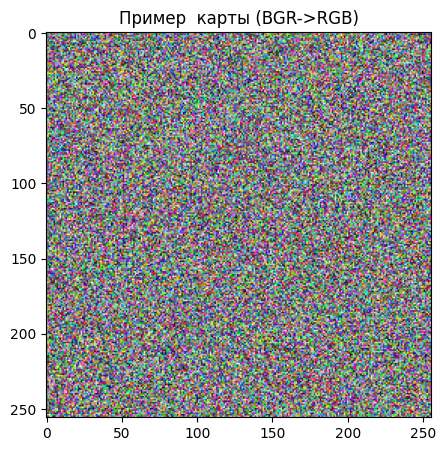

In [4]:
# Пример: сгенерируем и покажем
test_map = generate_random_map(256,256)
#test_map = load_big_map("https://storage.googleapis.com/p-oaf-ibe-back-00e-strapi-uploads/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729.jpg")

plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(test_map, cv2.COLOR_BGR2RGB))  # переводим BGR->RGB для отображения в matplotlib
plt.title("Пример  карты (BGR->RGB)")
plt.show()


##1.2 Функция вырезания «цели» (target_crop)

In [5]:
def get_random_target_crop(big_map, target_size=32):
    """
    Из 'big_map' выбираем случайный квадратик (target_size x target_size).
    Возвращаем:
      1) target_crop - (target_size, target_size, 3) [BGR]
      2) (target_x, target_y) - координаты левого верхнего угла этого квадрата
    """
    H, W, _ = big_map.shape

    # Случайно выбираем координаты
    y = random.randint(0, H - target_size)
    x = random.randint(0, W - target_size)

    # Вырезаем из big_map
    target_crop = big_map[y:y+target_size, x:x+target_size, :]

    return target_crop, x, y


Визуализация (пример, как выглядит цель):

Размеры исходного изображения (H,W,?): (1080, 1920, 3)
Координаты цели на карте: (1823, 843)


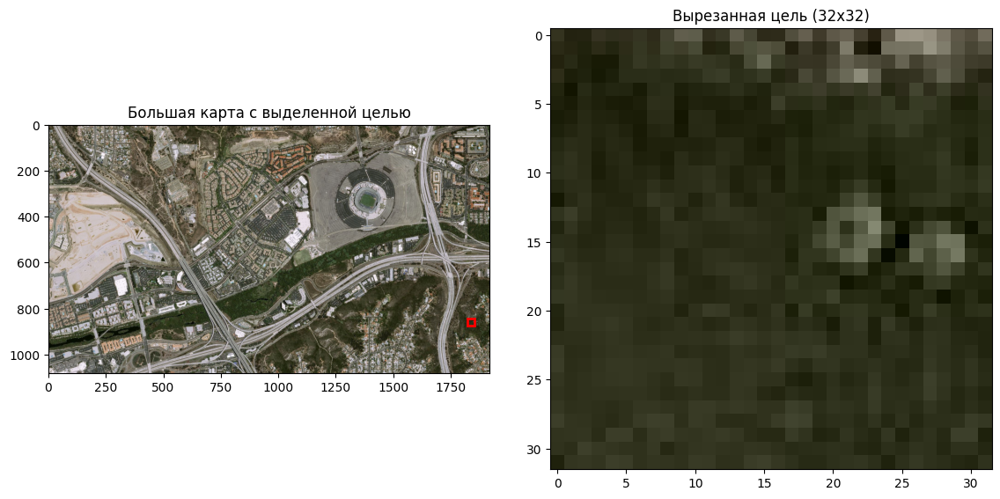

In [6]:
# Генерация карты и выбор цели
#demo_map = generate_random_map(256, 256) # rundom map
demo_map = load_big_map("https://storage.googleapis.com/p-oaf-ibe-back-00e-strapi-uploads/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729.jpg")
demo_target_crop, tx, ty = get_random_target_crop(demo_map, target_size=32)

print("Координаты цели на карте:", (tx, ty))

# Визуализация большой карты с выделением цели и вырезанной цели рядом
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 строка, 2 столбца

# Первая ось: большая карта с выделенной целью
map_rgb = cv2.cvtColor(demo_map, cv2.COLOR_BGR2RGB)  # Конвертируем BGR в RGB для корректного отображения
axes[0].imshow(map_rgb)
axes[0].set_title("Большая карта с выделенной целью")
#axes[0].axis('off')  # Отключаем оси для чистого вида

# Рисуем прямоугольник вокруг цели
rect = plt.Rectangle(
    (tx, ty),          # Начальная точка (левый верхний угол)
    32,                # Ширина прямоугольника (размер цели по оси x)
    32,                # Высота прямоугольника (размер цели по оси y)
    linewidth=2,       # Толщина линии
    edgecolor='red',   # Цвет линии
    facecolor='none'   # Внутренняя заливка прозрачная
)
axes[0].add_patch(rect)  # Добавляем прямоугольник на изображение

# Вторая ось: вырезанная цель
target_rgb = cv2.cvtColor(demo_target_crop, cv2.COLOR_BGR2RGB)  # Конвертируем BGR в RGB
axes[1].imshow(target_rgb)
axes[1].set_title("Вырезанная цель (32x32)")
#axes[1].axis('off')  # Отключаем оси для чистого вида

plt.tight_layout(pad=3.0)  # Добавляем отступы между субплотами
plt.show()


#Шаг 2. Класс среды (Environment)

##2.1 Идея среды
У нас есть «большая карта» (big_map), где прячется «цель» (32×32) по координатам (target_x, target_y).
Дрон начинает в случайной точке (drone_x, drone_y).
На каждом шаге дрон может двигаться: вверх (0), вниз (1), влево (2), вправо (3).
Дрон видит (1) локальный фрагмент окружения 64×64 вокруг своей позиции, (2) саму цель (32×32), растянутую до 64×64. В итоге 6 каналов (3 для карты, 3 для цели).
Награда:
reward = (старое_расстояние - новое_расстояние) за приближение/удаление,
+10, если подошли ближе, чем target_threshold пикселей,
-10, если вышли за границы карты.

##2.2 Реализация

In [7]:
class DroneEnv:
    """
    Среда для дрона, который ищет на карте заданный фрагмент (цель).
    """
    def __init__(
        self,
        big_map,             # (H,W,3)
        target_crop,         # (target_size, target_size, 3)
        target_x, target_y,  # координаты левого верхнего угла цели
        drone_view_size=64,  # окно "камеры" дрона
        target_size=32,
        target_threshold=5
    ):
        """
        Сохраняем основные параметры и сбрасываем состояние.
        """
        self.big_map = big_map
        self.height, self.width, _ = big_map.shape

        self.target_crop = target_crop
        self.target_size = target_size

        self.target_x = target_x
        self.target_y = target_y

        self.drone_view_size = drone_view_size
        self.target_threshold = target_threshold

        # Для вычисления центра цели берём: (target_x + target_size//2, target_y + target_size//2)

        # Вызываем reset() - сгенерирует стартовую позицию дрона и вернёт начальное наблюдение.
        self.reset()

    def reset(self):
        """
        Случайно позиционируем дрон и возвращаем начальное observation (64,64,6).
        """
        self.drone_x = random.randint(0, self.width - 1)
        self.drone_y = random.randint(0, self.height - 1)

        self.prev_distance = self._distance_to_target(self.drone_x, self.drone_y)

        return self._get_observation()

    def step(self, action):
        """
        Совершаем шаг по действию:
          0=up, 1=down, 2=left, 3=right.
        Возвращаем (obs, reward, done).
        """
        if action == 0:   # up
            self.drone_y -= 1
        elif action == 1: # down
            self.drone_y += 1
        elif action == 2: # left
            self.drone_x -= 1
        elif action == 3: # right
            self.drone_x += 1

        # Если вышли за границы:
        if (self.drone_x < 0 or self.drone_x >= self.width or
            self.drone_y < 0 or self.drone_y >= self.height):
            # Сразу done и штраф
            return self._get_observation(), -10.0, True

        # Считаем новую дистанцию
        new_distance = self._distance_to_target(self.drone_x, self.drone_y)
        # Награда за приближение/удаление
        reward = self.prev_distance - new_distance

        # Если достаточно близко к центру цели -> считаем, что нашли
        if new_distance <= self.target_threshold:
            reward += 10.0
            done = True
        else:
            done = False

        self.prev_distance = new_distance

        return self._get_observation(), reward, done

    def _distance_to_target(self, x, y):
        """
        Евклидово расстояние от (x,y) дрона до
        (target_x + target_size//2, target_y + target_size//2).
        """
        cx = self.target_x + self.target_size//2
        cy = self.target_y + self.target_size//2
        return math.sqrt((x - cx)**2 + (y - cy)**2)

    def _get_observation(self):
        """
        Возвращаем склеенное изображение (64,64,6):
          - 3 канала: локальный фрагмент big_map (64x64)
          - 3 канала: target_crop (32x32), растянутая до (64x64)
        """
        # 1) Получаем фрагмент окружения
        env_view = self._crop_around_drone()

        # 2) Растягиваем цель (32x32 -> 64x64)
        target_resized = cv2.resize(
            self.target_crop,
            (self.drone_view_size, self.drone_view_size),
            interpolation=cv2.INTER_AREA
        )

        # 3) Склеиваем по оси каналов: (64,64,3) + (64,64,3) = (64,64,6)
        obs = np.concatenate([env_view, target_resized], axis=2)
        return obs

    def _crop_around_drone(self):
        """
        Вырезаем 64x64 вокруг (drone_x, drone_y).
        Если выходим за границы, делаем паддинг нулями (черный).
        """
        half = self.drone_view_size // 2

        left = max(0, self.drone_x - half)
        right = min(self.width, self.drone_x + half)
        top = max(0, self.drone_y - half)
        bottom = min(self.height, self.drone_y + half)

        crop = self.big_map[top:bottom, left:right, :]  # BGR

        h, w, c = crop.shape
        result = np.zeros((self.drone_view_size, self.drone_view_size, 3), dtype=np.uint8)
        result[:h, :w, :] = crop

        return result


Визуализация: Можно проверить, как выглядит первоначальное состояние дрона — окружение + цель:

Размер returned obs: (64, 64, 6)  (должно быть (64,64,6))


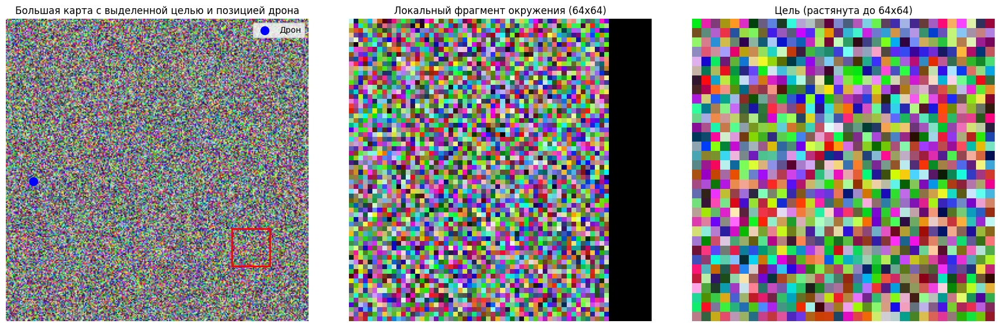

In [8]:
# Демонстрация среды с визуализацией позиции дрона на большой карте

# Предполагается, что функции generate_random_map, get_random_target_crop, load_big_map,
# и класс DroneEnv уже определены в предыдущих шагах.

# Загрузка большой карты из указанного URL
# Если функция load_big_map не определена, необходимо её реализовать или использовать альтернативный метод загрузки изображения.
# Например, можно использовать urllib для скачивания изображения.

# Загрузка карты
#_big_map = load_big_map("https://storage.googleapis.com/p-oaf-ibe-back-00e-strapi-uploads/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729.jpg")
# Генерация случайно карты
_big_map = generate_random_map(256, 256)

# Выбор случайной цели
_tcrop, _tx, _ty = get_random_target_crop(_big_map, 32)

# Создание среды
env_demo = DroneEnv(
    _big_map,   # карта
    _tcrop,     # цель
    _tx, _ty,   # координаты цели
    drone_view_size=64,
    target_size=32,
    target_threshold=5
)

# Сброс среды для инициализации позиции дрона
obs_demo = env_demo.reset()

print("Размер returned obs:", obs_demo.shape, " (должно быть (64,64,6))")

# Извлечение частей наблюдения
env_part = obs_demo[..., 0:3]  # BGR окружения
tgt_part = obs_demo[..., 3:6]  # BGR цели, растянутой до (64,64)

# Для отображения через plt.imshow нужно перевести BGR->RGB:
env_part_rgb = cv2.cvtColor(env_part, cv2.COLOR_BGR2RGB)
tgt_part_rgb = cv2.cvtColor(tgt_part, cv2.COLOR_BGR2RGB)

# Извлекаем текущие координаты дрона
drone_x = env_demo.drone_x
drone_y = env_demo.drone_y

# Визуализация большой карты с выделенной целью и позицией дрона
plt.figure(figsize=(18,6))  # Ширина увеличена для размещения трёх изображений в ряд

# 1. Большая карта с выделенной целью и позицией дрона
plt.subplot(1,3,1)
map_rgb = cv2.cvtColor(_big_map, cv2.COLOR_BGR2RGB)  # Конвертируем BGR в RGB
plt.imshow(map_rgb)
plt.title("Большая карта с выделенной целью и позицией дрона")
plt.axis('off')

# Рисуем прямоугольник вокруг цели
rect = plt.Rectangle(
    (_tx, _ty),        # Начальная точка (левый верхний угол)
    32,                # Ширина прямоугольника (размер цели по оси x)
    32,                # Высота прямоугольника (размер цели по оси y)
    linewidth=2,       # Толщина линии
    edgecolor='red',   # Цвет линии
    facecolor='none'   # Внутренняя заливка прозрачная
)
plt.gca().add_patch(rect)

# Рисуем маркер дрона
plt.scatter(
    drone_x, drone_y,
    c='blue',          # Цвет маркера
    s=100,             # Размер маркера
    marker='o',        # Форма маркера
    label='Дрон'
)
plt.legend(loc='upper right')

# 2. Локальный фрагмент окружения (64x64)
plt.subplot(1,3,2)
plt.imshow(env_part_rgb)
plt.title("Локальный фрагмент окружения (64x64)")
plt.axis('off')

# 3. Цель (растянута до 64x64)
plt.subplot(1,3,3)
plt.imshow(tgt_part_rgb)
plt.title("Цель (растянута до 64x64)")
plt.axis('off')

plt.tight_layout(pad=3.0)  # Добавляем отступы между субплотами
plt.show()


#Шаг 3. Преобразование observation → PyTorch Tensor
В этом шаге мы:

* Берём obs формата (64,64,6), где:
* первые 3 канала — BGR окружения,
* вторые 3 канала — BGR цели.
* Разделяем их по каналам.
* Переводим BGR → RGB для обеих частей.
* Склеиваем назад в (64,64,6) (теперь уже RGB).
* Преобразуем в диапазон [0..1] (float32).
* Меняем форму с (H,W,C) на (C,H,W).
* Добавляем измерение batch → (1,C,H,W) (т.к. PyTorch ждёт [batch_size, channels, height, width]).




In [9]:
def obs_to_tensor(obs):
    """
    Преобразует (64,64,6) numpy в PyTorch-тензор (1, 6, 64,64).

    1. Разбиваем на env_bgr (64,64,3) и target_bgr (64,64,3).
    2. Конвертируем и то, и другое BGR->RGB.
    3. Склеиваем обратно → (64,64,6) (но уже в RGB-формате).
    4. Нормируем [0..1].
    5. Переставляем оси → (6,64,64).
    6. Добавляем batch-измерение → (1,6,64,64).
    7. Возвращаем tensor.to(device).
    """
    # 1) Разделим по каналам
    env_bgr = obs[..., 0:3]     # (64,64,3)
    target_bgr = obs[..., 3:6]  # (64,64,3)

    # 2) Перевод BGR->RGB
    env_rgb = cv2.cvtColor(env_bgr, cv2.COLOR_BGR2RGB)
    target_rgb = cv2.cvtColor(target_bgr, cv2.COLOR_BGR2RGB)

    # 3) Склеиваем (уже оба в RGB)
    merged = np.concatenate([env_rgb, target_rgb], axis=2)  # (64,64,6) RGB

    # 4) Нормировка
    merged = merged.astype(np.float32) / 255.0

    # 5) Перестановка осей (H,W,C) -> (C,H,W)
    merged = np.transpose(merged, (2,0,1))  # (6,64,64)

    # 6) Добавляем batch dim -> (1,6,64,64)
    merged = np.expand_dims(merged, axis=0)

    # 7) В PyTorch-тензор
    tensor = torch.from_numpy(merged).to(device)
    return tensor


Теперь сеть будет работать в едином цветовом формате (RGB), что обычно предпочтительнее, чем смешивать BGR и RGB.

#Шаг 4. Определяем архитектуру сети (DQNNet)
Мы делаем DQN, где:

* Вход: (batch_size, 6, 64,64) (6 каналов, 64×64 размер).
* Выход: Q-значения для 4 действий.

In [10]:
class DQNNet(nn.Module):
    """
    Простейшая CNN, обрабатывающая (6,64,64) и выдающая 4 Q-значения (up/down/left/right).
    """
    def __init__(self, num_actions=4, in_channels=6):
        super(DQNNet, self).__init__()
        # Сверточные слои
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=5, stride=2),  # -> (32, 30, 30)
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=5, stride=2),           # -> (64, 13, 13)
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=2),           # -> (64, 6, 6)
            nn.ReLU()
        )

        # Полносвязные слои
        self.fc = nn.Sequential(
            nn.Linear(64*6*6, 256),
            nn.ReLU(),
            nn.Linear(256, num_actions)  # 4 действия
        )

    def forward(self, x):
        # x: (batch_size, 6, 64, 64)
        x = self.conv(x)  # -> (batch_size, 64, 6, 6)
        x = x.view(x.size(0), -1)  # -> (batch_size, 64*6*6)
        x = self.fc(x)             # -> (batch_size, 4)
        return x


# Шаг 5. Replay Buffer и функция вычисления TD-ошибки
Классический DQN использует буфер повторов (ReplayBuffer) для хранения кортежей (state, action, reward, next_state, done).



##5.1 ReplayBuffer
Этот буфер — обычная очередь с максимальной длиной capacity; когда она переполняется, «старые» записи удаляются.

In [11]:
class ReplayBuffer:
    def __init__(self, capacity=10000):
        self.capacity = capacity
        self.buffer = deque(maxlen=capacity)

    def push(self, state, action, reward, next_state, done):
        self.buffer.append((state, action, reward, next_state, done))

    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)
        return states, actions, rewards, next_states, dones

    def __len__(self):
        return len(self.buffer)


## 5.2 Функция вычисления TD-ошибки (loss)

In [12]:
def compute_td_loss(policy_net, target_net, optimizer, batch, gamma=0.99):
    """
    DQN loss:
    L = MSE( Q(s,a) - [r + gamma * max_a' Q_target(s', a')] )
    """
    states, actions, rewards, next_states, dones = batch

    # Преобразуем states, next_states в тензоры
    state_tensors = []
    next_state_tensors = []
    for s, ns in zip(states, next_states):
        state_tensors.append(obs_to_tensor(s))  # (1,6,64,64)
        next_state_tensors.append(obs_to_tensor(ns))

    state_batch = torch.cat(state_tensors, dim=0)      # (batch_size, 6,64,64)
    next_state_batch = torch.cat(next_state_tensors, 0)# (batch_size, 6,64,64)

    actions = torch.LongTensor(actions).to(device)    # (batch_size,)
    rewards = torch.FloatTensor(rewards).to(device)   # (batch_size,)
    dones   = torch.FloatTensor(dones).to(device)     # (batch_size,)

    # Q(s,a) = policy_net(state_batch)[range(batch_size), actions]
    q_values = policy_net(state_batch)  # (batch_size, 4)
    q_values = q_values.gather(1, actions.unsqueeze(1)).squeeze(1)  # (batch_size,)

    with torch.no_grad():
        # max Q_target(s', a')
        next_q_values = target_net(next_state_batch)  # (batch_size, 4)
        max_next_q_values, _ = torch.max(next_q_values, dim=1)  # (batch_size,)

        # Если done=1, то target = reward
        # Иначе target = reward + gamma*max_next_q
        target = rewards + (1.0 - dones) * gamma * max_next_q_values

    loss = nn.MSELoss()(q_values, target)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss.item()


#Шаг 6. Основной цикл обучения
Теперь собираем всё вместе. На каждом эпизоде мы:

* Генерируем новую случайную карту.
* Выбираем случайную цель (32×32) на ней.
* Создаём env = DroneEnv(...).
* Запускаем эпизод (до max_steps или пока не будет done).
* Действуем e-greedy (с параметром epsilon).
* Сохраняем переход в ReplayBuffer.
* Если буфер достаточно наполнен, делаем один шаг обучения compute_td_loss(...).
* Периодически обновляем target_net (раз в target_update эпизодов).

In [13]:
#util:
def crop_center(img, crop_size=(256, 256)):
    """
    Обрезает изображение по центру до заданного размера.

    Args:
        img (numpy.ndarray): Исходное изображение.
        crop_size (tuple): Размер обрезки (ширина, высота).

    Returns:
        numpy.ndarray: Обрезанное изображение.
    """
    height, width, _ = img.shape
    crop_width, crop_height = crop_size

    if width < crop_width or height < crop_height:
        raise ValueError("Размер изображения меньше размера обрезки.")

    start_x = width // 2 - crop_width // 2
    start_y = height // 2 - crop_height // 2

    cropped_img = img[start_y:start_y + crop_height, start_x:start_x + crop_width]
    return cropped_img

In [14]:
def train_dqn(
    num_episodes=500,
    max_steps=500,
    batch_size=32,
    gamma=0.99,
    lr=1e-3,
    target_update=20,
    buffer_capacity=10000
):
    """
    Запускаем обучение DQN, каждый эпизод генерируем новую случайную карту и цель.
    Возвращаем:
      policy_net - обученная сеть
      rewards_history - список суммарных наград за эпизод
      success_history - список, где каждый элемент - 1 если цель достигнута, иначе 0
      steps_history - список количества шагов за эпизод
      loss_history - список средних потерь за эпизод
    """
    # Создаём сеть и target-net
    policy_net = DQNNet(num_actions=4, in_channels=6).to(device)
    target_net = DQNNet(num_actions=4, in_channels=6).to(device)

    target_net.load_state_dict(policy_net.state_dict())
    target_net.eval()

    # Оптимизатор
    optimizer = optim.Adam(policy_net.parameters(), lr=lr)

    # ReplayBuffer
    replay_buffer = ReplayBuffer(capacity=buffer_capacity)

    # Параметры e-greedy
    epsilon_start = 1.0
    epsilon_final = 0.01
    epsilon_decay = 5000.0  # за сколько шагов epsilon упадёт от 1.0 к 0.01

    # Инициализация статистики
    global_step = 0
    rewards_history = []
    success_history = []      # 1 если цель достигнута, иначе 0
    steps_history = []        # Количество шагов за эпизод
    loss_history = []         # Среднее значение потерь за эпизод
    falls_outside_history = []# Количество падений за границы за эпизод

    # Для визуализации
    successes = 0
    falls_outside = 0

    # Инициализация среды для обучения, карты и цели
    target_size = 16
    big_map = load_big_map("https://storage.googleapis.com/p-oaf-ibe-back-00e-strapi-uploads/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729.jpg")
    big_map = crop_center(big_map, crop_size=(80, 80))
    for episode in range(1, num_episodes + 1):
        # 1) Генерируем карту
        #big_map = generate_random_map(256,256)
        # 2) Вырезаем цель
        target_crop, tx, ty = get_random_target_crop(big_map, target_size)
        # 3) Создаём среду
        env = DroneEnv(
            big_map, target_crop, tx, ty,
            drone_view_size=64, target_size = target_size, target_threshold=5
        )

        # Начальное наблюдение
        state = env.reset()
        total_reward = 0.0
        episode_loss = []
        episode_falls = 0

        for step_i in range(max_steps):
            # Считаем текущее epsilon
            epsilon = epsilon_final + (epsilon_start - epsilon_final) * math.exp(-1.0 * global_step / epsilon_decay)

            # e-greedy выбор действия
            if random.random() < epsilon:
                action = random.randint(0,3)  # случайное действие
            else:
                # Вычисляем Q-values
                state_tensor = obs_to_tensor(state)  # (1,6,64,64)
                with torch.no_grad():
                    q_values = policy_net(state_tensor)  # (1,4)
                action = torch.argmax(q_values, dim=1).item()  # int

            # Делаем шаг в среде
            next_state, reward, done = env.step(action)
            total_reward += reward

            # Сохраняем в буфер
            replay_buffer.push(state, action, reward, next_state, done)

            # Переходим в следующее состояние
            state = next_state

            # Обновляем сеть, если буфер достаточно наполнен
            if len(replay_buffer) > batch_size:
                batch = replay_buffer.sample(batch_size)
                loss = compute_td_loss(policy_net, target_net, optimizer, batch, gamma=gamma)
                episode_loss.append(loss)

            global_step += 1

            if done:
                if reward >= 10.0:
                    successes += 1
                    success_history.append(1)
                else:
                    # Предполагаем, что при падении за границы reward < 10
                    success_history.append(0)
                    episode_falls += 1
                break

        # Если эпизод не завершился досрочно, считаем его неуспешным
        if not done:
            success_history.append(0)

        # Сохраняем статистику
        rewards_history.append(total_reward)
        steps_history.append(step_i + 1)
        loss_avg = np.mean(episode_loss) if episode_loss else 0
        loss_history.append(loss_avg)
        falls_outside_history.append(episode_falls)

        # Каждые target_update эпизодов копируем веса
        if (episode % target_update) == 0:
            target_net.load_state_dict(policy_net.state_dict())

        # Каждые 10 эпизодов печатаем расширенный отчет
        if (episode % 10) == 0:
            avg_reward = np.mean(rewards_history[-10:])
            avg_steps = np.mean(steps_history[-10:])
            avg_loss = np.mean(loss_history[-10:])
            total_successes = sum(success_history[-10:])
            total_falls = sum(falls_outside_history[-10:])
            print(f"Эпизод {episode}/{num_episodes} | "
                  f"Средняя награда (последние 10): {avg_reward:.2f} | "
                  f"Среднее количество шагов: {avg_steps:.1f} | "
                  f"Средняя потеря: {avg_loss:.4f} | "
                  f"Достигнуто целей: {total_successes}/10 | "
                  f"Вышли за границы: {total_falls}/10 | "
                  f"Epsilon: {epsilon:.2f}")

    # После обучения возвращаем всю собранную статистику
    return policy_net, rewards_history, success_history, steps_history, loss_history, falls_outside_history


Комментарии:

* epsilon_decay=5000: значит, где-то к шагу ~5000 глобального времени epsilon упадёт до ~0.01.
* target_update=20: каждые 20 эпизодов копируем веса в target_net, чтобы стабилизировать обучение.

# Шаг 7. Запуск обучения и визуализация результатов

In [15]:
# Запускаем обучение DQN с расширенной статистикой
policy_net, rewards_history, success_history, steps_history, loss_history, falls_outside_history = train_dqn(num_episodes=250)


Размеры исходного изображения (H,W,?): (1080, 1920, 3)
Эпизод 10/250 | Средняя награда (последние 10): 17.53 | Среднее количество шагов: 194.6 | Средняя потеря: 0.2480 | Достигнуто целей: 5/10 | Вышли за границы: 5/10 | Epsilon: 0.68
Эпизод 20/250 | Средняя награда (последние 10): 31.51 | Среднее количество шагов: 192.3 | Средняя потеря: 0.0750 | Достигнуто целей: 5/10 | Вышли за границы: 4/10 | Epsilon: 0.47
Эпизод 30/250 | Средняя награда (последние 10): 31.52 | Среднее количество шагов: 201.9 | Средняя потеря: 0.1891 | Достигнуто целей: 8/10 | Вышли за границы: 2/10 | Epsilon: 0.31
Эпизод 40/250 | Средняя награда (последние 10): 20.97 | Среднее количество шагов: 284.1 | Средняя потеря: 0.1147 | Достигнуто целей: 4/10 | Вышли за границы: 4/10 | Epsilon: 0.18
Эпизод 50/250 | Средняя награда (последние 10): 15.39 | Среднее количество шагов: 169.7 | Средняя потеря: 0.2849 | Достигнуто целей: 5/10 | Вышли за границы: 3/10 | Epsilon: 0.13
Эпизод 60/250 | Средняя награда (последние 10): 4.

 Визуализация результатов обучения:

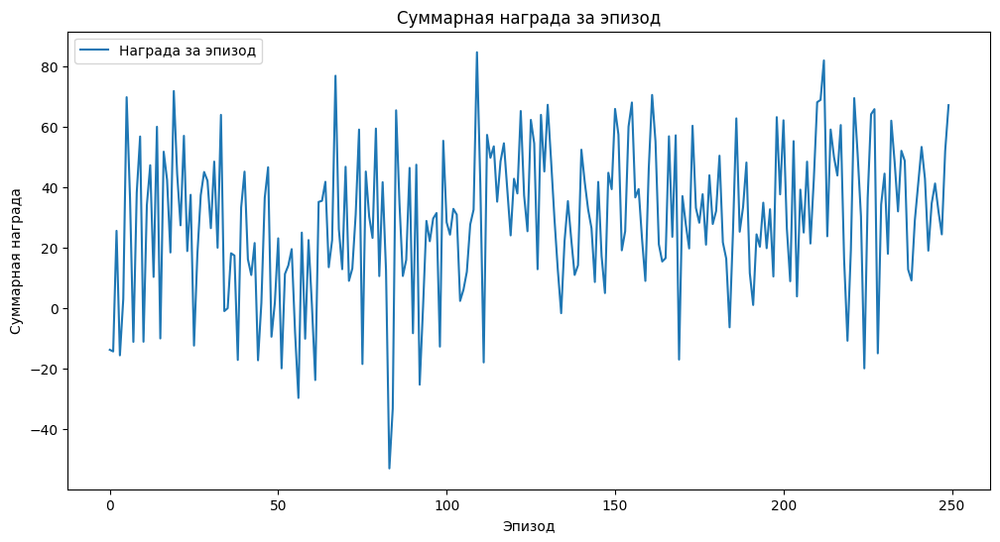

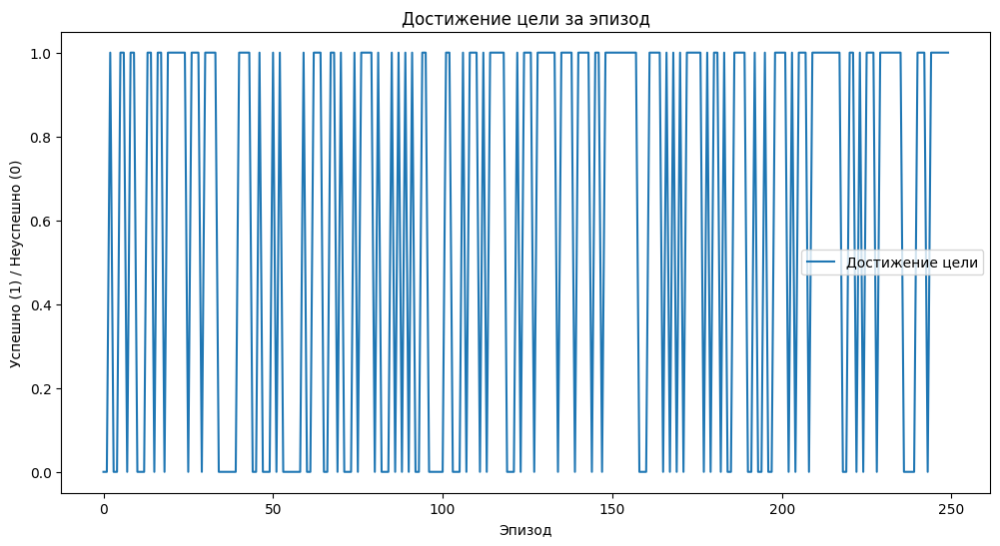

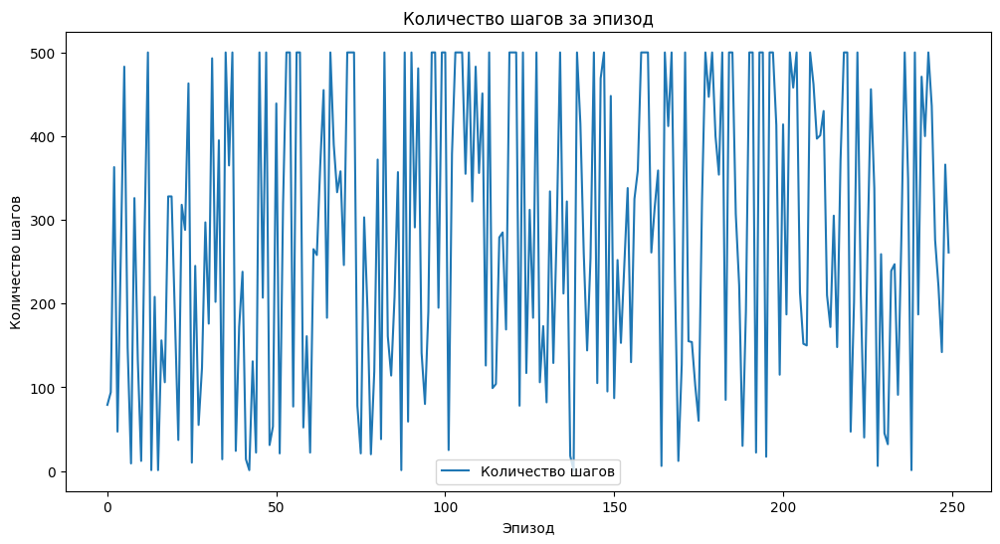

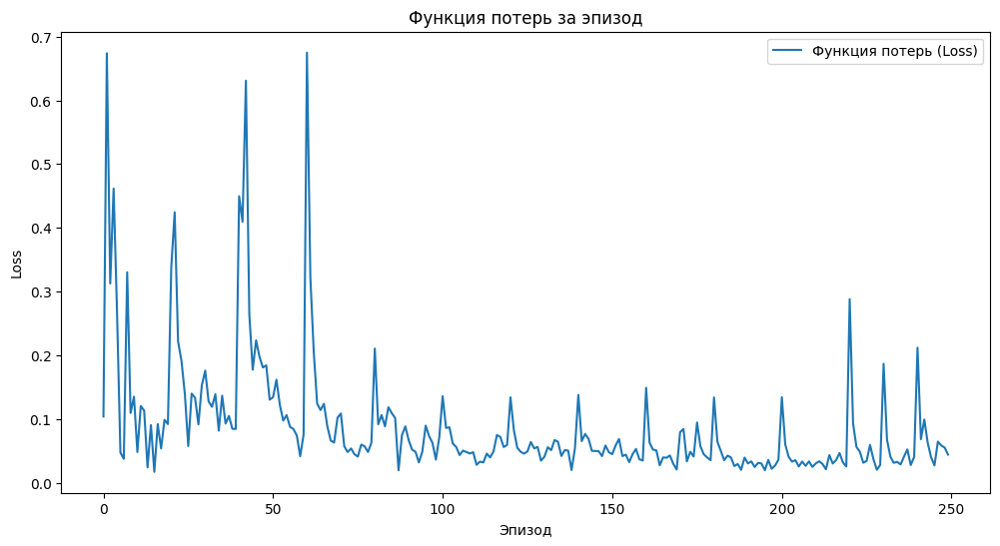

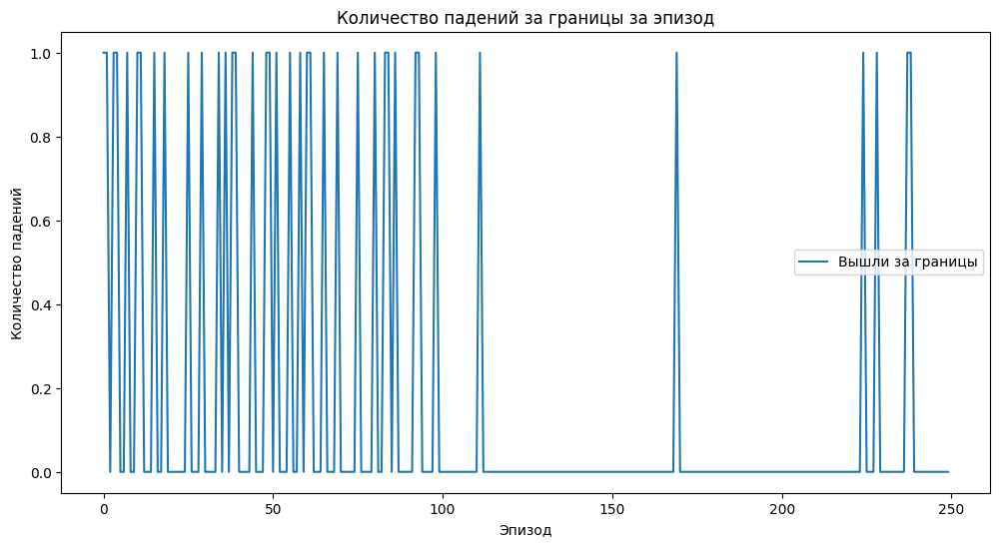

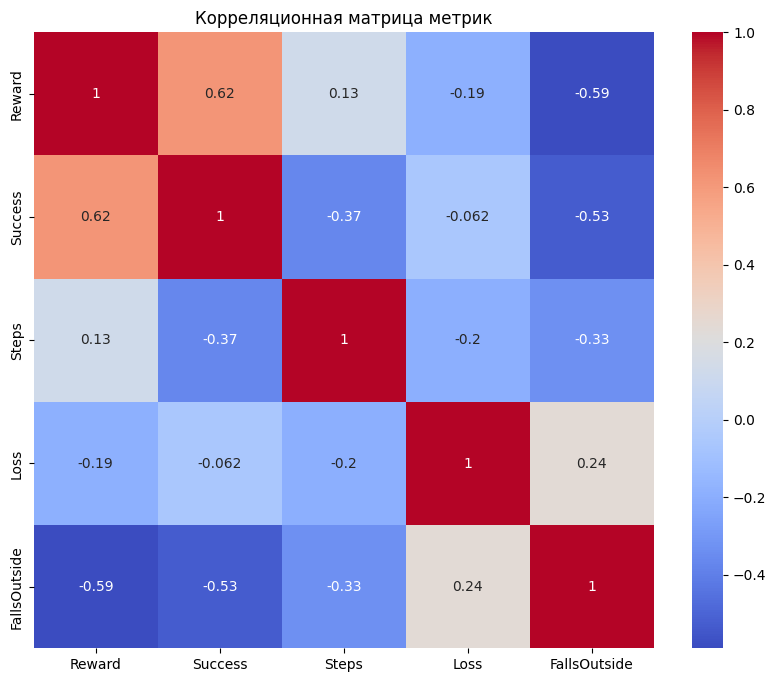

In [16]:
import seaborn as sns

# 1. Визуализация Наград
plt.figure(figsize=(12,6))
plt.plot(rewards_history, label='Награда за эпизод')
plt.title("Суммарная награда за эпизод")
plt.xlabel("Эпизод")
plt.ylabel("Суммарная награда")
plt.legend()
plt.show()

# 2. Визуализация Успешных Достижений Цели
plt.figure(figsize=(12,6))
plt.plot(success_history, label='Достижение цели')
plt.title("Достижение цели за эпизод")
plt.xlabel("Эпизод")
plt.ylabel("Успешно (1) / Неуспешно (0)")
plt.legend()
plt.show()

# 3. Визуализация Среднего Количества Шагов
plt.figure(figsize=(12,6))
plt.plot(steps_history, label='Количество шагов')
plt.title("Количество шагов за эпизод")
plt.xlabel("Эпизод")
plt.ylabel("Количество шагов")
plt.legend()
plt.show()

# 4. Визуализация Потерь (Loss)
plt.figure(figsize=(12,6))
plt.plot(loss_history, label='Функция потерь (Loss)')
plt.title("Функция потерь за эпизод")
plt.xlabel("Эпизод")
plt.ylabel("Loss")
plt.legend()
plt.show()

# 5. Визуализация Количества Падений за Границы
plt.figure(figsize=(12,6))
plt.plot(falls_outside_history, label='Вышли за границы')
plt.title("Количество падений за границы за эпизод")
plt.xlabel("Эпизод")
plt.ylabel("Количество падений")
plt.legend()
plt.show()

# 6. Визуализация Корреляции Между Наградой и Успехом
# Создаём DataFrame для анализа
data = {
    'Reward': rewards_history,
    'Success': success_history,
    'Steps': steps_history,
    'Loss': loss_history,
    'FallsOutside': falls_outside_history
}

df = pd.DataFrame(data)

# Корреляционная матрица
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title("Корреляционная матрица метрик")
plt.show()


Ожидаемый результат:

Сначала агент блуждает случайно, награды невелики (часто и отрицательные).
Постепенно кривая наград должна расти, если агент начинает ориентироваться на цель.


# Шаг 8. Тестирование модели
Сделаем функцию test_dqn, чтобы посмотреть, как дрон ведёт себя на новых сгенерированных картах:

In [17]:
def test_dqn(policy_net, num_episodes=5, max_steps=250):
    """
    Запускаем несколько тестовых эпизодов без обучения.
    На каждой итерации: генерируем карту + цель,
    запускаем среду, агент действует "жадно" (argmax Q).
    """
    policy_net.eval()  # переводим сеть в режим eval
    big_map = load_big_map("https://storage.googleapis.com/p-oaf-ibe-back-00e-strapi-uploads/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729.jpg")
    big_map = crop_center(big_map, crop_size=(256, 256))
    for i in range(num_episodes):
        #big_map = generate_random_map(256,256)
        target_crop, tx, ty = get_random_target_crop(big_map, 32)
        env = DroneEnv(big_map, target_crop, tx, ty, 64, 32, target_threshold=5)

        state = env.reset()
        total_reward = 0
        steps = 0
        done = False

        # Для "трекшота" соберём несколько кадров, чтобы визуализировать
        frames_env = []
        frames_target = []

        while not done and steps < max_steps:
            # Выбираем действие жадно: argmax Q
            state_tensor = obs_to_tensor(state)
            with torch.no_grad():
                q_values = policy_net(state_tensor)
            action = torch.argmax(q_values, dim=1).item()

            next_state, reward, done = env.step(action)
            total_reward += reward

            # Сохраним кадры для визуализации
            env_part_bgr = next_state[..., 0:3]
            target_part_bgr = next_state[..., 3:6]
            # Переведём их в RGB:
            env_part_rgb = cv2.cvtColor(env_part_bgr, cv2.COLOR_BGR2RGB)
            target_part_rgb = cv2.cvtColor(target_part_bgr, cv2.COLOR_BGR2RGB)
            frames_env.append(env_part_rgb)
            frames_target.append(target_part_rgb)

            state = next_state
            steps += 1

        print(f"[Test Episode {i+1}] total_reward={total_reward:.2f}, steps={steps}")

        # Визуализируем последний кадр эпизода
        if len(frames_env) > 0:
            fig, ax = plt.subplots(1,2, figsize=(10,4))
            ax[0].imshow(frames_env[-1])
            ax[0].set_title("Последний вид окружения")
            ax[0].axis('off')
            ax[1].imshow(frames_target[-1])
            ax[1].set_title("Цель (растянутая)")
            ax[1].axis('off')
            plt.show()


Пояснения:

Здесь мы выводим в конце эпизода последний кадр с тем, что видит дрон (окружение) и растянутой целью. Можно также вывести анимацию (GIF) из всех кадров, но в Colab это занимает время.
Если агент обучился, мы увидим, что он старается сблизиться с целью и получает положительную награду, а число шагов до достижения цели не слишком велико (зависит от сложности карты и дистанции).

RUN:

Размеры исходного изображения (H,W,?): (1080, 1920, 3)
[Test Episode 1] total_reward=-12.15, steps=250


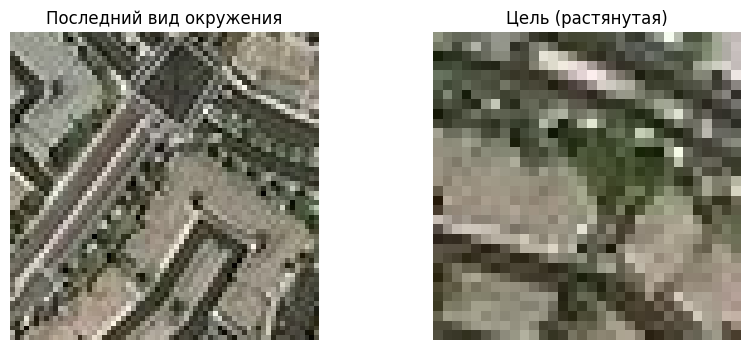

[Test Episode 2] total_reward=-51.72, steps=250


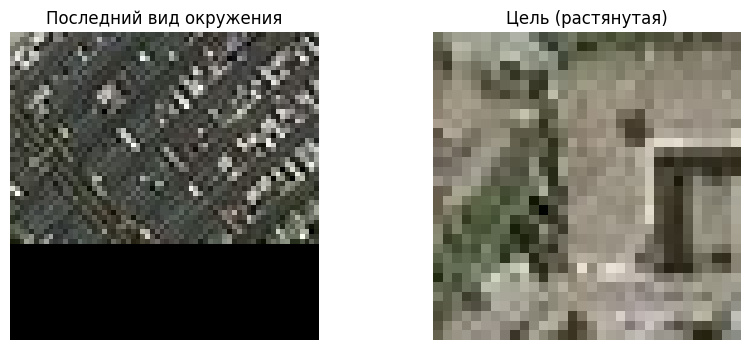

[Test Episode 3] total_reward=-10.86, steps=250


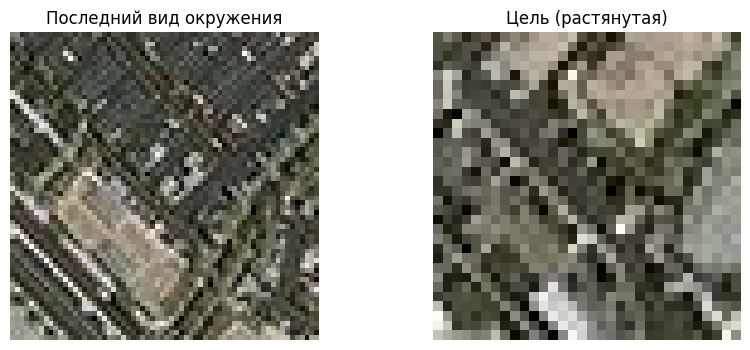

[Test Episode 4] total_reward=2.52, steps=250


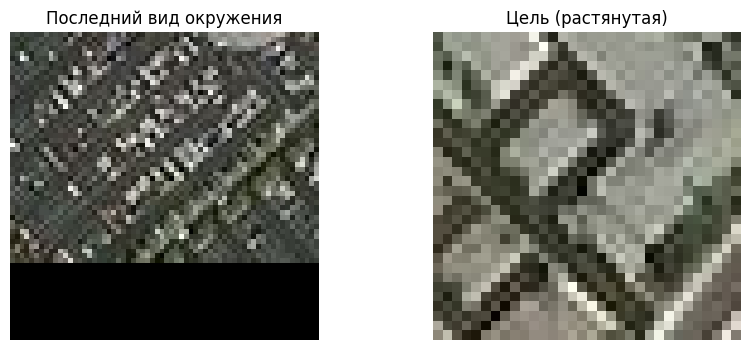

[Test Episode 5] total_reward=-4.64, steps=250


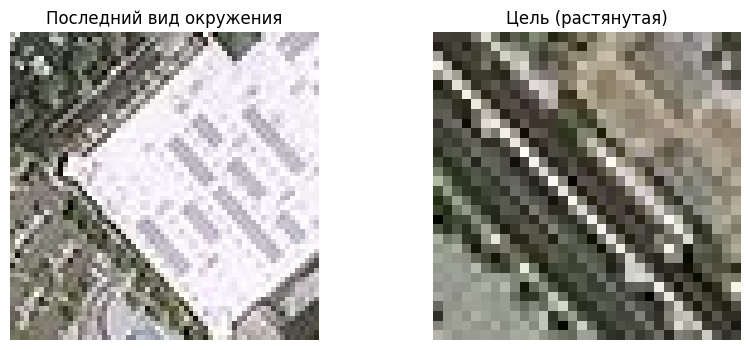

In [18]:
test_dqn(policy_net, num_episodes=5)


## 8.3 Функция для тестирования модели с анимацией
Ниже приведена обновлённая функция test_dqn, которая выполняет несколько тестовых эпизодов, записывает позиции дрона на каждом шаге и создаёт анимированные GIF-файлы, отображающие движение дрона по карте.

In [19]:
import imageio
from IPython.display import Image, display
import cv2
import numpy as np

def test_dqn_with_animation(policy_net, num_episodes=3, max_steps=200):
    """
    Запускает несколько тестовых эпизодов, визуализирует путь дрона в виде анимации с областью видимости.

    Параметры:
    - policy_net: обученная DQN-сеть
    - num_episodes: количество тестовых эпизодов
    - max_steps: максимальное количество шагов в эпизоде
    """
    policy_net.eval()  # Переводим сеть в режим оценки
    big_map = load_big_map("https://storage.googleapis.com/p-oaf-ibe-back-00e-strapi-uploads/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729/ID_6_Banner_San_Diego_PHR_1_B_20150724_47f7833729.jpg")
    big_map = crop_center(big_map, crop_size=(70, 70))
    for episode in range(1, num_episodes + 1):
        # Генерируем случайную карту и цель
        #big_map = generate_random_map(256, 256)
        target_crop, tx, ty = get_random_target_crop(big_map, target_size=16)

        # Создаём среду
        env = DroneEnv(
            big_map=big_map,
            target_crop=target_crop,
            target_x=tx,
            target_y=ty,
            drone_view_size=64,
            target_size=32,
            target_threshold=5
        )

        # Сброс среды и получение начального наблюдения
        state = env.reset()
        total_reward = 0.0
        done = False
        steps = 0

        # Списки для записи позиций дрона
        drone_positions = []

        while not done and steps < max_steps:
            # Выбираем действие жадно (без exploration)
            state_tensor = obs_to_tensor(state)
            with torch.no_grad():
                q_values = policy_net(state_tensor)  # Получаем Q-значения для всех действий
            action = torch.argmax(q_values, dim=1).item()  # Выбираем действие с максимальным Q-значением

            # Выполняем действие в среде
            next_state, reward, done = env.step(action)
            total_reward += reward
            steps += 1

            # Сохраняем позицию дрона
            drone_positions.append((env.drone_x, env.drone_y))

            # Переходим к следующему состоянию
            state = next_state

        print(f"[Тестовый эпизод {episode}] Общая награда: {total_reward:.2f}, Шагов: {steps}")

        # Создаём анимацию траектории дрона с областью видимости
        create_animation(
            big_map=big_map,
            drone_positions=drone_positions,
            target_x=tx,
            target_y=ty,
            episode_num=episode,
            fov_size=64  # Размер области видимости дрона
        )

def create_animation(big_map, drone_positions, target_x, target_y, episode_num, fov_size=64):
    """
    Создаёт и отображает анимацию движения дрона по карте с отображением области видимости.

    Параметры:
    - big_map: большая карта (H, W, 3) [BGR]
    - drone_positions: список кортежей (x, y) позиций дрона
    - target_x, target_y: координаты левого верхнего угла цели
    - episode_num: номер эпизода (для названия файла)
    - fov_size: размер области видимости дрона (ширина и высота в пикселях)
    """
    frames = []

    # Конвертируем карту из BGR в RGB для корректного отображения
    map_rgb = cv2.cvtColor(big_map, cv2.COLOR_BGR2RGB)

    # Рисуем цель на карте
    map_with_target = map_rgb.copy()
    cv2.rectangle(
        map_with_target,
        (target_x, target_y),
        (target_x + 32, target_y + 32),
        color=(255, 0, 0),  # Красный цвет в RGB
        thickness=2
    )

    # Полупрозрачный слой для области видимости
    overlay = map_with_target.copy()
    alpha = 0.3  # Прозрачность области видимости

    # Рисуем путь дрона и область видимости на каждом кадре
    for idx, (dx, dy) in enumerate(drone_positions):
        # Копируем карту для текущего кадра
        frame = map_with_target.copy()

        # Определяем координаты области видимости
        half_fov = fov_size // 2
        top_left_x = max(dx - half_fov, 0)
        top_left_y = max(dy - half_fov, 0)
        bottom_right_x = min(dx + half_fov, map_rgb.shape[1] - 1)
        bottom_right_y = min(dy + half_fov, map_rgb.shape[0] - 1)

        # Рисуем прямоугольник области видимости на overlay
        cv2.rectangle(
            overlay,
            (top_left_x, top_left_y),
            (bottom_right_x, bottom_right_y),
            color=(0, 255, 255),  # Жёлтый цвет для области видимости
            thickness=-1  # Закрашенный прямоугольник
        )

        # Альфа-блендинг для создания полупрозрачности
        cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0, frame)

        # Рисуем путь дрона до текущей позиции
        for pos in drone_positions[:idx + 1]:
            cv2.circle(
                frame,
                pos,
                radius=2,
                color=(0, 255, 0),  # Зелёный цвет для пути
                thickness=-1
            )

        # Рисуем текущую позицию дрона
        cv2.circle(
            frame,
            (dx, dy),
            radius=5,
            color=(0, 0, 255),  # Красный цвет для текущей позиции
            thickness=-1
        )

        # Добавляем текущий кадр в список
        frames.append(frame)

        # Сбрасываем overlay для следующего кадра
        overlay = map_with_target.copy()

    # Сохраняем анимацию в формате GIF
    gif_filename = f'drone_animation_episode_{episode_num}.gif'
    imageio.mimsave(gif_filename, frames, fps=10)

    # Отображаем анимацию в блокноте
    with open(gif_filename, "rb") as file:
        display(Image(data=file.read()))


Размеры исходного изображения (H,W,?): (1080, 1920, 3)
[Тестовый эпизод 1] Общая награда: -1.64, Шагов: 200


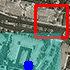

[Тестовый эпизод 2] Общая награда: -0.38, Шагов: 200


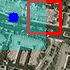

[Тестовый эпизод 3] Общая награда: 6.52, Шагов: 200


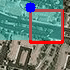

[Тестовый эпизод 4] Общая награда: -6.00, Шагов: 200


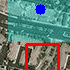

[Тестовый эпизод 5] Общая награда: -6.20, Шагов: 200


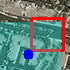

In [28]:
test_dqn_with_animation(policy_net, num_episodes=5, max_steps=200)